In [1]:
#LFP filtering - Monroe 
%reload_ext autoreload
%autoreload 2

In [2]:
# run this cell
import pynwb
import os

#DataJoint and DataJoint schema
import datajoint as dj
import numpy as np
import pandas as pd

## We also import a bunch of tables so that we can call them easily

from nwb_datajoint.common import (RawPosition, HeadDir, Speed, LinPos, StateScriptFile, VideoFile,
                                  DataAcquisitionDevice, CameraDevice, Probe,
                                  DIOEvents,
                                  ElectrodeGroup, Electrode, Raw, SampleCount,
                                  LFPSelection, LFP, LFPBandSelection, LFPBand,
                                  FirFilter,
                                  IntervalList,
                                  Lab, LabMember, LabTeam, Institution,
                                  BrainRegion,
                                  SensorData,
                                  Session, ExperimenterList,
                                  Subject,
                                  Task, TaskEpoch,
                                  Nwbfile, AnalysisNwbfile, NwbfileKachery, AnalysisNwbfileKachery,
                                  get_electrode_indices)
from nwb_datajoint.common.common_position import (PositionInfoParameters,IntervalPositionInfo)
from nwb_datajoint.common.common_interval import interval_list_intersect



from plot_lfp import (get_x_y_list, get_speed, get_timestamps_and_data,get_electrode_ids,remove_dead_tet_chans,check_for_dead_probes,
                      checking_other_dead_tets,simple_plot,plot_overlay,plot_overlay_with_pos,plot_speed_versus_theta, find_overlapping_times)

import re
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)
#do this from the tutorial notebook. close everything, close jupyter server... clean start!

Connecting emonroe@lmf-db.cin.ucsf.edu:3306


/home/emonroe/miniconda2/envs/nwb_datajoint/lib/python3.8/site-packages/position_tools/core.py:3: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


#### Next we select the NWB file, which corresponds to the dataset we want to extract LFP from

### choose every 4th electrode 

In [3]:
#define nwb file, get all the potential electrodes 
nwb_file_name = 'senor20201030_.nwb'


lfp_electrode_ids =get_electrode_ids(nwb_file_name, which_elects =4, ref=True)

#remove permanently dead tetrode channels. (the ones above tet 24).
lfp_electrode_ids = remove_dead_tet_chans(nwb_file_name, lfp_electrode_ids, perm_dead_chan=96)
lfp_electrode_ids

check_for_dead_probes(nwb_file_name, lfp_electrode_ids)

#look at dead tetrodes that actually could have existed, make sure another electrode from the tet is represented
#If the dead channel is not in our list of electrodes, print none. 
#in testing, none of dead ones were the first in the electrode group, so need to test with a working case when i need it. 
lfp_electrode_ids = checking_other_dead_tets(nwb_file_name,lfp_electrode_ids)

original electrode ids, minus ref = [  0   4  40  44  48  52  56  60  64  68  72  76   8  80  84  88  92  96
 100 104 108 112 116  12 120 124 128 132 136 140 144 148 152 156 160 164
 168 172 176 180 184 188 192 196 200 204 208 212 216 220 224 228 232 236
 240 244 248 252 256 260 264 268 272 276 280 284 288 292 296 300 304 308
 312 316 320 324 328 332 336 340 344 348 352 356 360 364 368 372 376 380
  16  20  24  28  32  36]
added references = [ 17  48  64 288]
lfp electrode ids, plus references = [  0   4   8  12  16  17  20  24  28  32  36  40  44  48  52  56  60  64
  68  72  76  80  84  88  92  96 100 104 108 112 116 120 124 128 132 136
 140 144 148 152 156 160 164 168 172 176 180 184 188 192 196 200 204 208
 212 216 220 224 228 232 236 240 244 248 252 256 260 264 268 272 276 280
 284 288 292 296 300 304 308 312 316 320 324 328 332 336 340 344 348 352
 356 360 364 368 372 376 380]
removing [ 96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 112 113
 114 115 116 117 118 1

# check probes and tetrode dead channels to take off LFP list 

## Put electrode selection and nwb file selection into LFPSelection table 

In [ ]:
# LFPSelection().set_lfp_electrodes(nwb_file_name, lfp_electrode_ids)
# LFP().populate([LFPSelection & {'nwb_file_name':nwb_file_name}])
# LFP() & {'nwb_file_name' : nwb_file_name}
# # (LFPSelection().LFPElectrode() & {'nwb_file_name' : nwb_file_name}).fetch('electrode_group_name')

In [ ]:
LFPSelection

## Load the raw data, define its timestamps and data 


In [4]:
raw_timestamps, raw_data, raw_eseries = get_timestamps_and_data(nwb_file_name,data_type = ['raw'])
lfp_timestamps, lfp_data, lfp_eseries = get_timestamps_and_data(nwb_file_name,data_type = ['lfp'])


IOStream.flush timed out


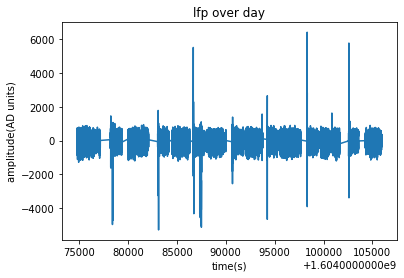

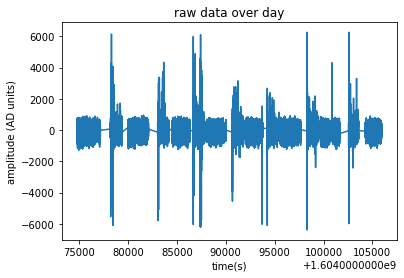

In [8]:
# simple_plot(lfp_timestamps,lfp_data[:,0],'lfp over day','time(s)','amplitude(AD units)')
# simple_plot(raw_timestamps,raw_data[:,0],'raw data over day','time(s)','amplitude (AD units)')

## theta filtering!

In [5]:
#theta Params
lfp_sampling_rate = (LFP() & {'nwb_file_name' : nwb_file_name}).fetch1('lfp_sampling_rate')
lfp_band_sampling_rate = lfp_sampling_rate
filter_name = 'Theta 5-11 Hz'
ref_elect = [-1]
interval_list_name = 'raw data valid times'
lfp_band_electrode_ids = lfp_electrode_ids

# LFPBandSelection().set_lfp_band_electrodes(nwb_file_name, lfp_band_electrode_ids, filter_name, interval_list_name, ref_elect, lfp_band_sampling_rate)
# LFPBand().populate([(LFPBandSelection() & {'nwb_file_name' : nwb_file_name} & {'target_interval_list_name':interval_list_name}).proj()])
LFPBand() & {'nwb_file_name' : nwb_file_name}
theta_timestamps, theta_data, theta_eseries = get_timestamps_and_data(nwb_file_name,filter_type=[filter_name],data_type = ['theta'])

In [ ]:
LFPBandSelection()

## plot all  electrodes, lfp

In [23]:
# %matplotlib inline
# for ix in range(len(lfp_electrode_ids)):
#     electrode_id = lfp_electrode_ids[ix]
#     lfp_index = get_electrode_indices(lfp_eseries,[electrode_id])
#     plt.figure()
#     plt.plot(lfp_timestamps,lfp_data[:,lfp_index])
#     plt.title(f'lfp data of electrode {electrode_id}') 
#     plt.xlabel('time(s)')
#     plt.ylabel('amplitude (AD units)')

In [6]:
#find the times corresponding to the start and end of run 1, the session we will visualize for the rest of this notebook! The 
#funcitons depend on this "epoch", though any sessions intervals could be used. 

epoch = (IntervalList & {'nwb_file_name': nwb_file_name} & {'interval_list_name':'02_r1'}).fetch1('valid_times')
epoch



array([[1.60407821e+09, 1.60407941e+09]])

# This cell is very important!

## define the times and electrodes you want to visualize in the next plots. 
### Want to make this a bit more flexible on a plot b y plot basis

## Then run the function "get_x_y" to get the timestamps and data corresponding to these times/electrode to plot soon. 

In [7]:
position_info = (IntervalPositionInfo() &
                 {'nwb_file_name': nwb_file_name,
                  'interval_list_name': 'pos 1 valid times',
                  'position_info_param_name': 'default'}
                ).fetch1_dataframe()




In [8]:
electrode_id = [0]
time_from_start = 100 #in seconds
time_interval_s = 10
sampling_rate_lfp = 1000 #lfp sampling rate
sampling_rate_orig = (LFP() & {'nwb_file_name': nwb_file_name}).fetch1('filter_sampling_rate')
offset = 0


x_elect_lfp, y_elect_lfp =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)
x_elect_raw, y_elect_raw =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, raw_eseries, raw_timestamps, raw_data)
x_elect_theta, y_elect_theta =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, theta_eseries, theta_timestamps, theta_data)
x_pos,y_pos = get_speed(position_info,epoch,time_from_start,time_interval_s)


# simple_plot(x_elect[0], y_elect[0],f'lfp data time {time_from_start}:{time_from_start+time_interval_s}','time(s)','amplitude(AD units)')



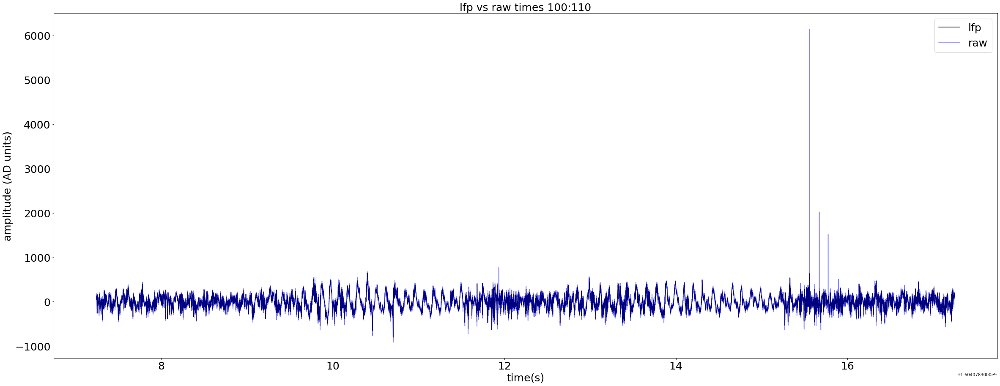

In [9]:
plot_overlay(x_elect_lfp[0],y_elect_lfp[0],'lfp','black',x_elect_raw[0],y_elect_raw[0],'raw','blue',f'lfp vs raw times {time_from_start}:{time_from_start+time_interval_s}','time(s)','amplitude (AD units)',offset = 0)

# plot raw, lfp, and theta filtered band for electrode and time interval of your choosing 

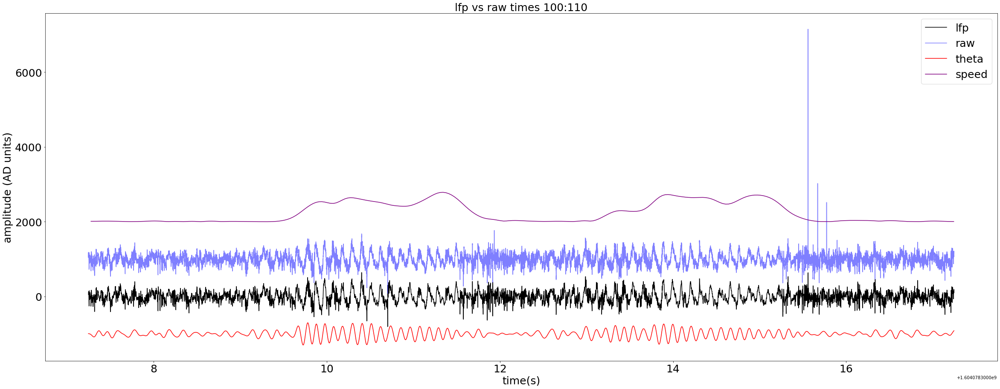

In [10]:
#This will plot the raw, lfp,theta bnd, and speed data (multiplied by 10 to see the change) with some defined overlap 
overlap=1000
plot_overlay(x0 = x_elect_lfp[0],y0 = y_elect_lfp[0],lab0='lfp',color0 = 'black',
             x1 = x_elect_raw[0],y1 = y_elect_raw[0],lab1 ='raw',color1 ='blue',
             title= f'lfp vs raw times {time_from_start}:{time_from_start+time_interval_s}',
             xlab ='time(s)',ylab= 'amplitude (AD units)',offset = overlap,
             x2 = x_elect_theta[0], y2=y_elect_theta[0],lab2='theta',color2='red',
             x3 = x_pos, y3=y_pos*10,lab3='speed',color3='purple')


# plot speed versus theta

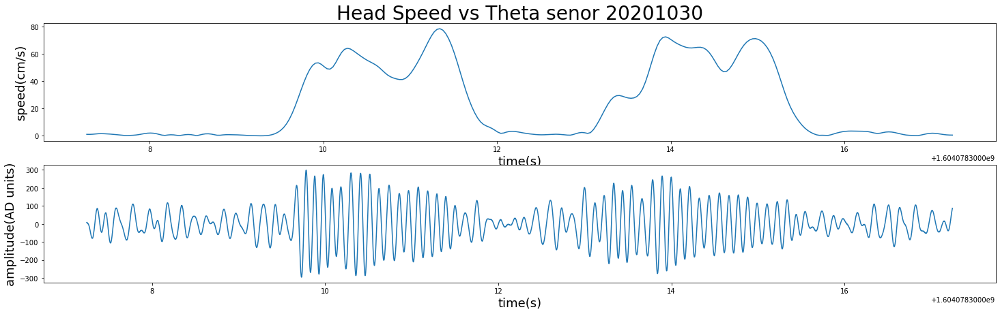

In [74]:
# #get the dat and rat name from nwb file name
import re
temp = re.findall(r'\d+', nwb_file_name)
day = list(map(int, temp))
rat_name = re.findall('([a-zA-Z ]*)\d*.*', nwb_file_name)[0]

plot_speed_versus_theta(x_pos, y_pos, x_elect_theta[0], y_elect_theta[0], f'Head Speed vs Theta {rat_name} {day[0]}','time(s)','speed(cm/s)','time(s)','amplitude(AD units)')


In [ ]:
#Plot theta vs speed on ALL electrodes!

# temp = re.findall(r'\d+', nwb_file_name)
# day = list(map(int, temp))
# rat_name = re.findall('([a-zA-Z ]*)\d*.*', nwb_file_name)[0]


#define that you want to look at all electrodes
# electrode_ids =lfp_band_electrode_ids
# plotting_key['electrode_id'] =electrode_ids
# x_elect,y_elect = get_x_y_list(plotting_key)


# for ix in range(len(y_elect)):    
#     fig, ax = plt.subplots(2, 1, figsize=(25, 7))
#     ax[0].plot(position_x, position_y)
#     ax[0].set_xlabel('Time', fontsize=18)
#     ax[0].set_ylabel('Speed [cm/s]', fontsize=18)
#     ax[0].set_title(f'Head Speed vs Theta rat = {rat_name}, date= {day[0]} electrode = {electrode_ids[ix]} \n tetrode {electrode_ids[ix]/4} if over 23, probe', fontsize=28)
    
#     theta_x = x_elect[ix]
#     theta_y = y_elect[ix]
#     ax[1].plot(theta_x, theta_y)
#     ax[1].set_xlabel('Time', fontsize=18)
#     ax[1].set_ylabel('Amplitude- \ntheta filtered \n AD units', fontsize=18)
 

# Redefining times to look at! Better way? 

In [13]:
#TO DO: got a way of customizing the key to getting the lfp data, but not yet flexible for the position data. 
#should turn that into a function too probably. job for tomorrow?

electrodes_to_compare= [0, 4, 72,68]

plotting_key = dict()
plotting_key['electrode_id'] =electrodes_to_compare
time_from_start = 1000  #in seconds
time_interval_s = 2
plotting_key['time_from_start'] = time_from_start
plotting_key['time_interval'] = time_interval_s
plotting_key['timestamps']=theta_timestamps
plotting_key['data']=theta_data
plotting_key['eseries']=theta_eseries
plotting_key['sampling_rate']=sampling_rate_lfp

x_elect,y_elect = get_x_y_list(plotting_key)

speed_key['time_from_start']= time_from_start 
speed_key['time_interval_s']= time_interval_s
speed_x, speed_y = get_speed(speed_key)

plt.figure(figsize=(15,5))
plt.plot(speed_x, speed_y,alpha=.5) 
plt.fill_between(speed_x, speed_y,color='grey',alpha=.3)
plt.title('speed of animal')
plt.xlabel('time(s)')
plt.ylabel('speed )cm/s')
plt.figure(figsize=(15,5))

for ix in range(len(y_elect)): 
    theta_x = x_elect[ix]
    theta_y = y_elect[ix]
    plt.plot(theta_x,theta_y,alpha=.5,label=f'electrode id {electrodes_to_compare[ix]}')
    plt.ylabel('amplitude (AD units)')
    plt.xlabel('time')
    plt.title(f'theta filtered signal. rat = {rat_name}, date= {day[0]} time = {time_from_start} : {time_from_start+time_interval_s}')
    plt.legend()



TypeError: get_x_y_list() missing 6 required positional arguments: 'time_interval_s', 'epoch', 'electrode_id', 'eseries', 'timestamps', and 'data'

In [ ]:
#spikesorting will hopefully be working soon 
# spike sorting for all of us, autocuration 
#lets say i wanted to ask a quesitons about theta modulation, i can setup a lot of it now, and think about designing it. 
#just theta sycnhrony in general. is hpc always leading or lagging? time in beh that 
#hilbert transform for phase deteciton
#basic signal prociessing (basic vs complicated ways to do it- stay simple) 
#then actually asking quesitons of it - know my questions, hypotheses, what plot i need to see to answer my quesiton. 
#figures and methods sections of these papers. 

#touch base: 
#ripple stuff, gut checks, knowing how it works (priority) 
#having questions/hypotheses/ plots 
#speed/reward questions still on the table (could get it from the DIOs, easier from parsed tria info with the 1s/0s) 



In [ ]:
# import re
# temp = re.findall(r'\d+', nwb_file_name)
# day = list(map(int, temp))
# rat_name = re.findall('([a-zA-Z ]*)\d*.*', nwb_file_name)[0]

# electrodes_to_compare= [0, 4, 72,68]
# # reference_1 = 17

# #user define! How long of a segment, when do oyu wnat it to start? 
# time_interval_s = 1
# time_from_start = 476

# position_start_timestamp = (position_info.index>epoch[0][0] +time_from_start)
# position_end_timestamps = (position_info.index<epoch[0][0]+time_from_start + time_interval_s)
# position_x = position_info.index[position_start_timestamp & position_end_timestamps]
# position_y = position_info.head_speed[position_start_timestamp & position_end_timestamps]
# position_y

# plt.figure(figsize=(15,5))
# plt.plot(position_x,position_y,alpha=.5) 
# plt.fill_between(position_x,position_y,color='grey',alpha=.3)
# plt.title('speed of animal')
# plt.xlabel('time(s)')
# plt.ylabel('speed )cm/s')
# plt.figure(figsize=(15,5))
# for ix in range(len(electrodes_to_compare)): 
#     electrode_id = electrodes_to_compare[ix]
#     # lfp_index = get_electrode_indices(lfp_eseries,[electrode_id])
#     # raw_index = get_electrode_indices(orig_eseries,[electrode_id])
#     theta_index = get_electrode_indices(theta_eseries,[electrode_id]) 

#     #find timestamps for theta data, and find the data between those timestamps
#     theta_start_timestamp = theta_timestamps>epoch[0][0] +time_from_start
#     theta_end_timestamp = (theta_timestamps<epoch[0][0]+time_interval_s+time_from_start)
#     theta_x = theta_timestamps[theta_start_timestamp & theta_end_timestamp]
#     theta_y = theta_data[(theta_start_timestamp & theta_end_timestamp),theta_index[0]]
    
#     plt.plot(theta_x,theta_y,alpha=.5,label=f'ca1 electrode # {electrode_id}')



# plt.ylabel('amplitude (AD units)')
# plt.xlabel('time')
# plt.title(f'theta filtered signal. rat = {rat_name}, date= {day[0]} time = {time_from_start} : {time_from_start+time_interval_s}')
# plt.legend()

In [ ]:
#Ignore this! twas my attempt at getting the phase correlation but I dont know what it actually results in 

# import scipy 

# electrode_id_1 = 0
# electrode_id_2 = 17

# theta_index_1 = get_electrode_indices(theta_eseries,[electrode_id_1]) 
# theta_index_2 = get_electrode_indices(theta_eseries,[electrode_id_2]) 


# theta_start_timestamp = theta_timestamps>epoch[0][0] +0
# theta_end_timestamp = (theta_timestamps<epoch[0][0]+0+.25)
# theta_y1 = theta_data[(theta_start_timestamp & theta_end_timestamp),theta_index_1[0]]
# theta_y2 = theta_data[(theta_start_timestamp & theta_end_timestamp),theta_index_2[0]]

# correlate_signal = scipy.signal.signaltools.correlate(theta_y1, theta_y2)

# plt.figure( figsize=(15,10))
# plt.plot(correlate_signal)
# # https://stackoverflow.com/questions/6157791/find-phase-difference-between-two-inharmonic-waves

In [ ]:

#questions for alison about functions.. passing ==True to have optino to do all three? 
#Is this too many variable names, should I pass as a dict? 
#how to best keep things flexible? 
#phase quantification? (fft the original signal?) Is this a valuable next step? 
#doing things in the context of run 1 or just overall? best way? 


# Ripple Filtering

In [14]:
#Okay so for ripple filtering, I need to have the list of electrodes and also a list of corresponding references 
from ripple_detection.detectors import Kay_ripple_detector



In [ ]:
#getting my own ripple stuff working, outside of the kay et al 

In [15]:
reference_list_ripple_filter = []
for ix in range(len(lfp_electrode_ids)): 
    electrode_id = lfp_electrode_ids[ix]
    reference = ((Electrode() & {'nwb_file_name' : nwb_file_name} & {'electrode_id' : electrode_id})).fetch1('original_reference_electrode')
    reference_list_ripple_filter.append(reference)
    
nwb_file_name
filter_name = 'Ripple 150-250 Hz'
target_interval_list_name = 'raw data valid times'
lfp_band_sampling_rate = (LFP() & {'nwb_file_name' : nwb_file_name}).fetch1('lfp_sampling_rate')

In [16]:
LFPBand & {'nwb_file_name':nwb_file_name} & {'filter_name' : filter_name}

nwb_file_name name of the NWB file,filter_name descriptive name of this filter,filter_sampling_rate sampling rate for this filter,target_interval_list_name descriptive name of this interval list,lfp_band_sampling_rate the sampling rate for this band,analysis_file_name name of the file,interval_list_name descriptive name of this interval list,filtered_data_object_id the NWB object ID for loading this object from the file
senor20201030_.nwb,Ripple 150-250 Hz,1000,raw data valid times,1000,senor20201030_ZC0H79HCSD.nwb,raw data valid times lfp band 1000Hz,5533b48f-8aef-43cf-bd43-7dfa8fa8be31


In [17]:
ripple_timestamps, ripple_data, ripple_eseries = get_timestamps_and_data(nwb_file_name,filter_type=[filter_name],data_type = ['ripple'])

In [18]:
electrode_id = [20]
time_from_start = 521 #in seconds
time_interval_s = 2
sampling_rate_lfp = 1000 #lfp sampling rate
sampling_rate_orig = (LFP() & {'nwb_file_name': nwb_file_name}).fetch1('filter_sampling_rate')
offset = 0


x_elect_lfp, y_elect_lfp =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)
x_elect_raw, y_elect_raw =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, raw_eseries, raw_timestamps, raw_data)
x_elect_theta, y_elect_theta =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, theta_eseries, theta_timestamps, theta_data)
x_elect_ripple, y_elect_ripple =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, ripple_eseries, ripple_timestamps, ripple_data)
x_pos,y_pos = get_speed(position_info,epoch,time_from_start,time_interval_s)
# plt.ylim(0,1000)

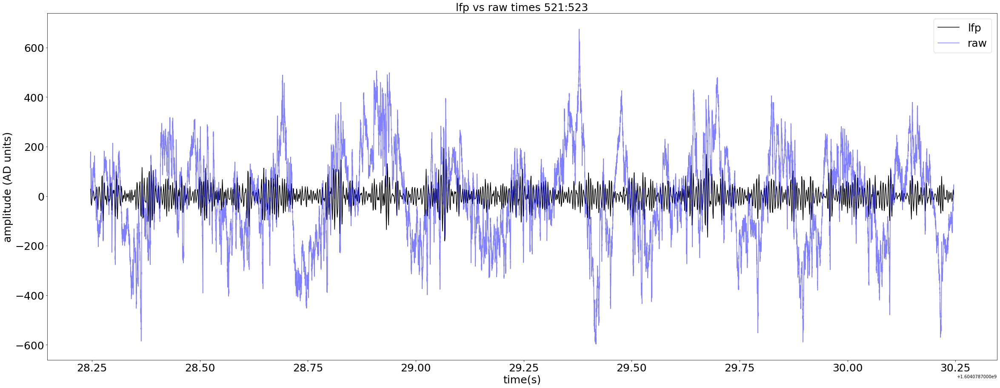

In [19]:
plot_overlay(x_elect_ripple[0],y_elect_ripple[0],'lfp','black',x_elect_raw[0],y_elect_raw[0],'raw','blue',f'lfp vs raw times {time_from_start}:{time_from_start+time_interval_s}','time(s)','amplitude (AD units)',offset = 0)

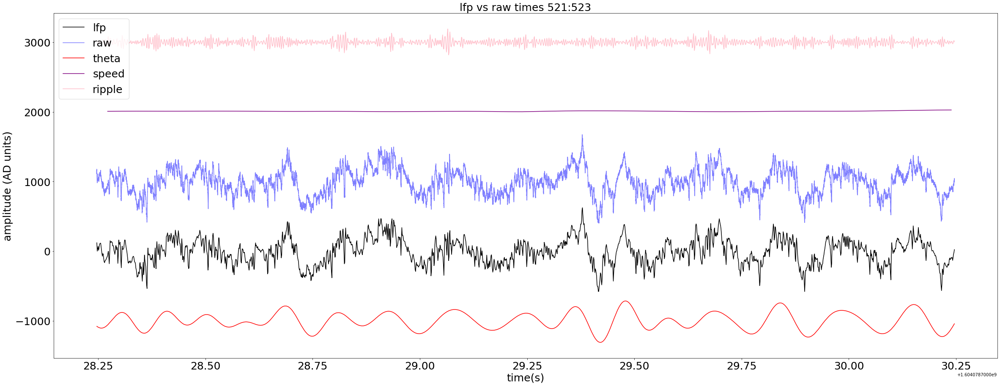

In [20]:
overlap=1000
plot_overlay(x0 = x_elect_lfp[0],y0 = y_elect_lfp[0],lab0='lfp',color0 = 'black',
             x1 = x_elect_raw[0],y1 = y_elect_raw[0],lab1 ='raw',color1 ='blue',
             title= f'lfp vs raw times {time_from_start}:{time_from_start+time_interval_s}',
             xlab ='time(s)',ylab= 'amplitude (AD units)',offset = overlap,
             x2 = x_elect_theta[0], y2=y_elect_theta[0],lab2='theta',color2='red',
             x3 = x_pos, y3=y_pos*10,lab3='speed',color3='purple',
             x4 =x_elect_ripple[0],y4 = y_elect_ripple[0], lab4 = 'ripple', color4 = 'pink')

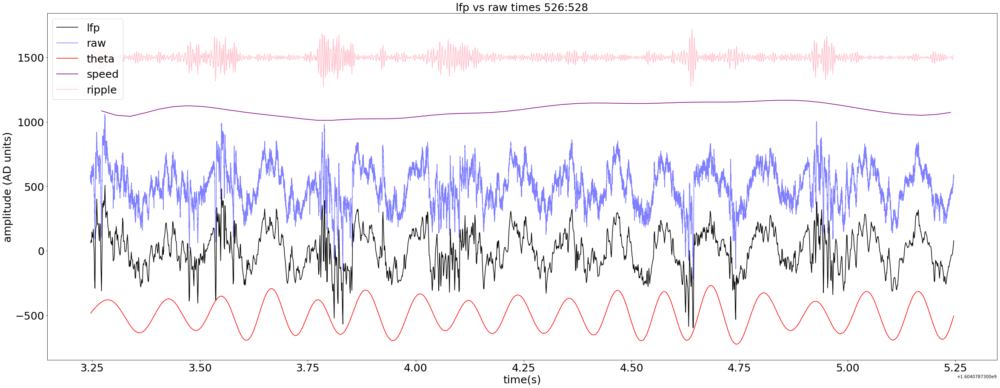

In [21]:
electrode_id = [40]
time_from_start = 526 #in seconds
time_interval_s = 2
sampling_rate_lfp = 1000 #lfp sampling rate
sampling_rate_orig = (LFP() & {'nwb_file_name': nwb_file_name}).fetch1('filter_sampling_rate')
offset = 0


x_elect_lfp, y_elect_lfp =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)
x_elect_raw, y_elect_raw =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, raw_eseries, raw_timestamps, raw_data)
x_elect_theta, y_elect_theta =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, theta_eseries, theta_timestamps, theta_data)
x_elect_ripple, y_elect_ripple =get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, ripple_eseries, ripple_timestamps, ripple_data)
x_pos,y_pos = get_speed(position_info,epoch,time_from_start,time_interval_s)
# plt.ylim(0,1000)

overlap=500
plot_overlay(x0 = x_elect_lfp[0],y0 = y_elect_lfp[0],lab0='lfp',color0 = 'black',
             x1 = x_elect_raw[0],y1 = y_elect_raw[0],lab1 ='raw',color1 ='blue',
             title= f'lfp vs raw times {time_from_start}:{time_from_start+time_interval_s}',
             xlab ='time(s)',ylab= 'amplitude (AD units)',offset = overlap,
             x2 = x_elect_theta[0], y2=y_elect_theta[0],lab2='theta',color2='red',
             x3 = x_pos, y3=y_pos*10,lab3='speed',color3='purple',
             x4 =x_elect_ripple[0],y4 = y_elect_ripple[0], lab4 = 'ripple', color4 = 'pink')

In [512]:
from plot_lfp import plot_overlay_with_pos





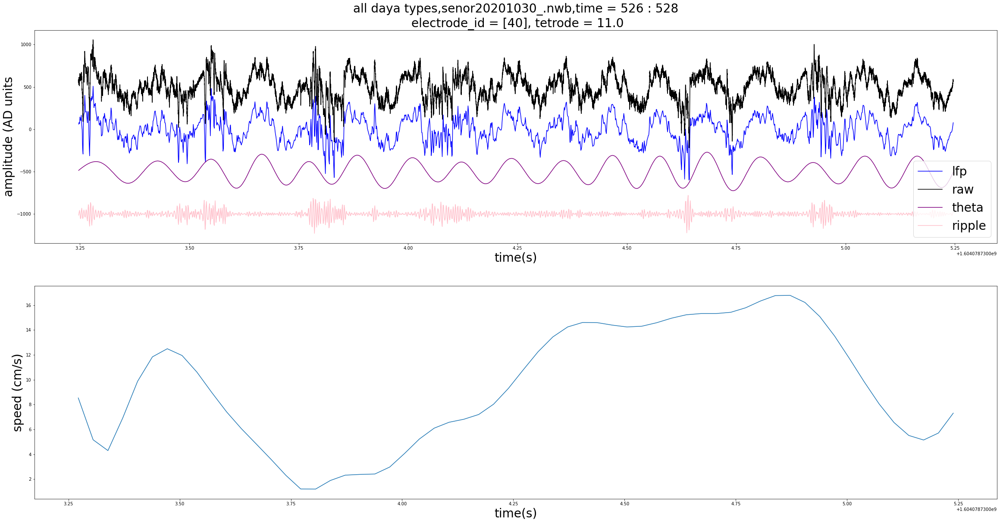

In [166]:
plot_overlay_with_pos(lfp_eseries, raw_eseries, theta_eseries, ripple_eseries, position_info, nwb_file_name, time_from_start, time_interval_s, epoch, electrode_id,offset = 500)

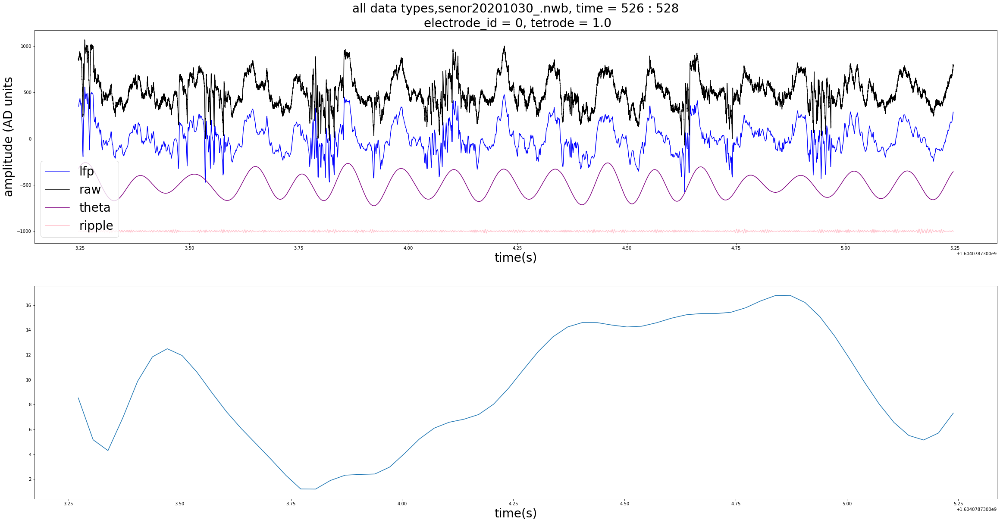

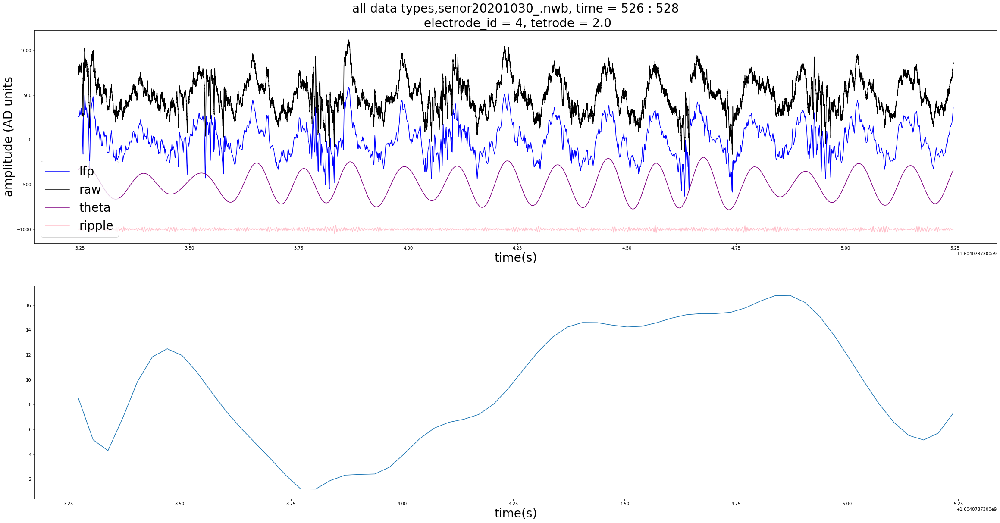

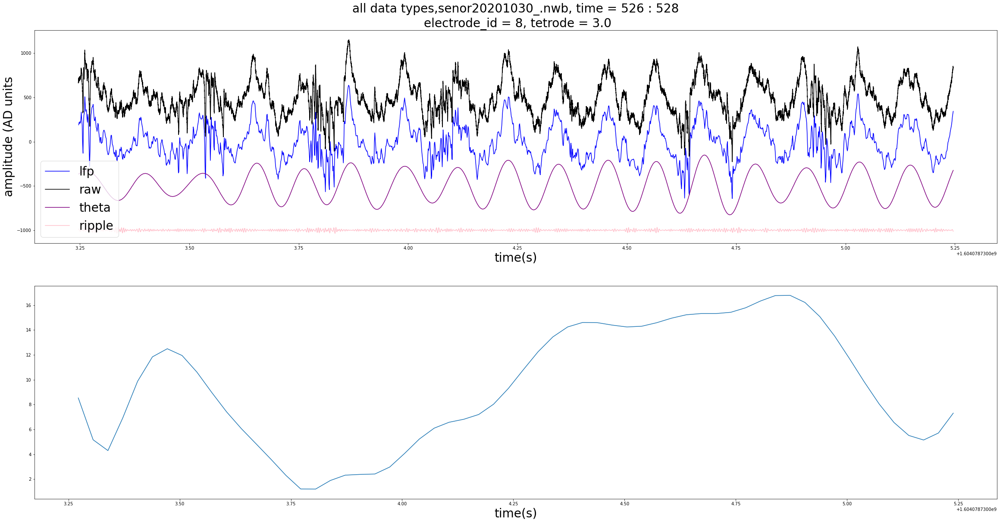

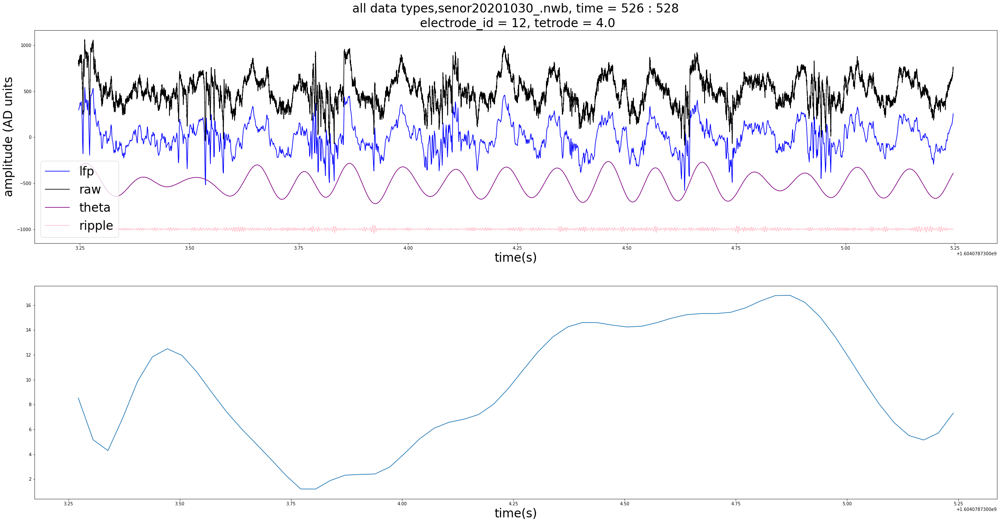

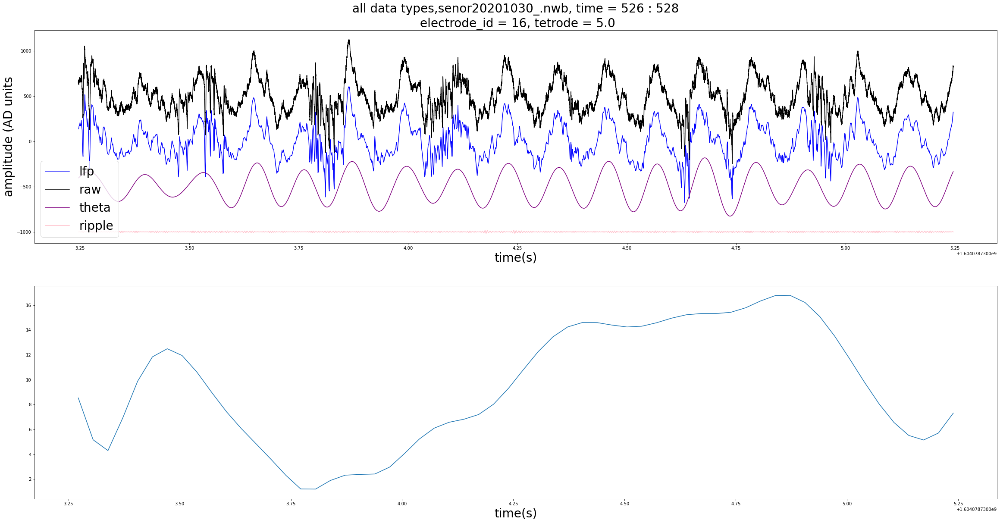

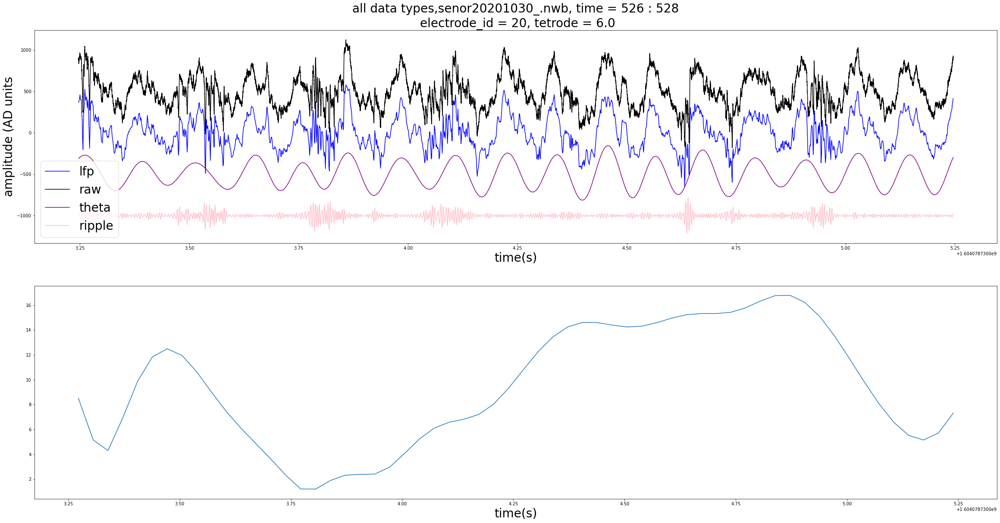

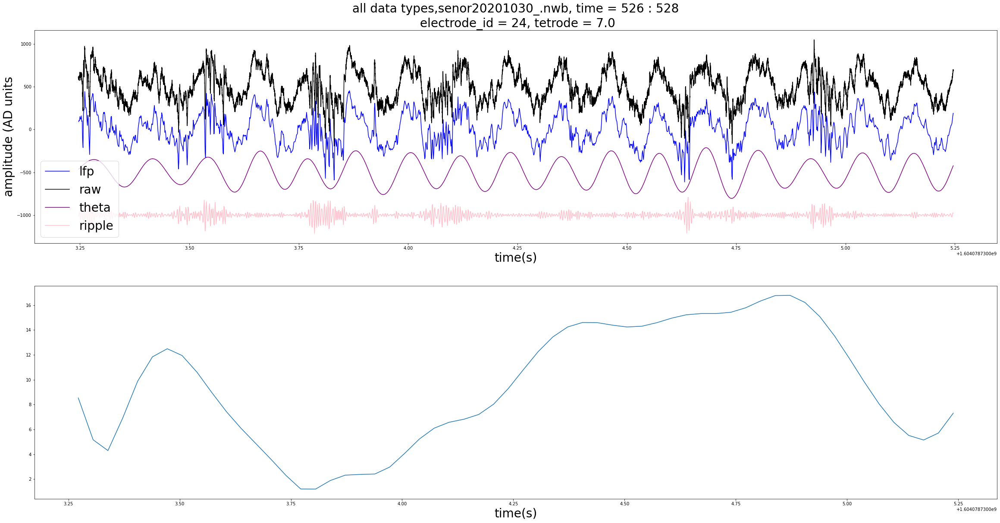

In [22]:
#rips on certain tets 
electrode_ids = [0,4,8,12,16,20,24]
# electrode_id = [40]
time_from_start = 526 #in seconds
time_interval_s = 2
sampling_rate_lfp = 1000 #lfp sampling rate
sampling_rate_orig = (LFP() & {'nwb_file_name': nwb_file_name}).fetch1('filter_sampling_rate')
offset = 0
f = plot_overlay_with_pos(lfp_eseries, raw_eseries, theta_eseries, ripple_eseries, position_info, nwb_file_name, time_from_start, time_interval_s, epoch, electrode_ids,offset = 500)


In [ ]:
# #plot_rips_on_all_tets 


# from matplotlib.backends.backend_pdf import PdfPages
# pp= PdfPages('save_rips.pdf')

# f = plot_overlay_with_pos(lfp_eseries, raw_eseries, theta_eseries, ripple_eseries, position_info, nwb_file_name, time_from_start, time_interval_s, epoch, lfp_electrode_ids,offset = 500)
# pp.savefig(f)
# pp.close()



In [23]:

#change lis tof desired electrodes if needed
lfp_electrode_ids
#find references corresponding to electrodes in electrode list 
reference_list_ripple_filter = []
for ix in range(len(lfp_electrode_ids)): 
    electrode_id = lfp_electrode_ids[ix]
    reference = ((Electrode() & {'nwb_file_name' : nwb_file_name} & {'electrode_id' : electrode_id})).fetch1('original_reference_electrode')
    reference_list_ripple_filter.append(reference)
    
    
ripple_key = dict()
ripple_key['nwb_file_name'] = nwb_file_name
ripple_key['filter_name'] = 'Ripple 150-250 Hz'
ripple_key['target_interval_list_name'] = 'raw data valid times'
ripple_key['lfp_band_sampling_rate'] = (LFP() & {'nwb_file_name' : nwb_file_name}).fetch1('lfp_sampling_rate')
# LFPBandSelection().set_lfp_band_electrodes(nwb_file_name,
#                                            lfp_band_electrode_ids,
#                                            ripple_key['filter_name'],
#                                            ripple_key['target_interval_list_name'],
#                                            reference_list_ripple_filter,
#                                            ripple_key['lfp_band_sampling_rate'])
                            
# LFPBand.populate([(LFPBandSelection & ripple_key).proj()])

#

In [24]:
LFPBand & {'nwb_file_name':nwb_file_name}

nwb_file_name name of the NWB file,filter_name descriptive name of this filter,filter_sampling_rate sampling rate for this filter,target_interval_list_name descriptive name of this interval list,lfp_band_sampling_rate the sampling rate for this band,analysis_file_name name of the file,interval_list_name descriptive name of this interval list,filtered_data_object_id the NWB object ID for loading this object from the file
senor20201030_.nwb,Ripple 150-250 Hz,1000,raw data valid times,1000,senor20201030_ZC0H79HCSD.nwb,raw data valid times lfp band 1000Hz,5533b48f-8aef-43cf-bd43-7dfa8fa8be31
senor20201030_.nwb,Theta 5-11 Hz,1000,raw data valid times,1000,senor20201030_EQV40VZL0L.nwb,raw data valid times lfp band 1000Hz,b518046c-2604-41fd-9036-54c9e2e405ed


In [32]:
lfp_sampling_rate = (LFPBand & {'nwb_file_name' : nwb_file_name,
                               'filter_name' : 'Ripple 150-250 Hz'}).fetch('lfp_band_sampling_rate')

# Get animal speed upsampled to LFP sampling rate
lfp_pos_df = (IntervalPositionInfo & {'nwb_file_name' : nwb_file_name,
                                      'interval_list_name' : 'pos 1 valid times',
                                      'position_info_param_name' : 'default_lfp'}).fetch1_dataframe()

# Head speed in cm/s - because that is a param of the ripple detection detection 
head_speed = np.asarray(lfp_pos_df.head_speed)

# Position timestamps in s
pos_time = lfp_pos_df.index

# Get ripple-filtered LFP
lfp_ripple_object = (LFPBand & {'nwb_file_name' : nwb_file_name,
                                'filter_name' : 'Ripple 150-250 Hz'}).fetch_nwb()[0]

# Ripple-filtered LFP in AD units
# No need to convert to volts because ripple detection occurs on standardized data
lfp_ripple = np.asarray( lfp_ripple_object['filtered_data'].data, dtype='double' )

lfp_time = lfp_ripple_object['filtered_data'].timestamps[:]

lfp_interval_list = (IntervalList & {'nwb_file_name' : nwb_file_name,
                                     'interval_list_name' : 'lfp valid times'}).fetch1('valid_times')
position_interval_list = (IntervalList & {'nwb_file_name' : nwb_file_name,
                                          'interval_list_name' : 'pos 1 valid times'}).fetch1('valid_times')



In [31]:
lfp_interval_list

array([[1.60407482e+09, 1.60407718e+09],
       [1.60407821e+09, 1.60407941e+09],
       [1.60408002e+09, 1.60408210e+09],
       [1.60408303e+09, 1.60408417e+09],
       [1.60408450e+09, 1.60408632e+09],
       [1.60408665e+09, 1.60408703e+09],
       [1.60408703e+09, 1.60408781e+09],
       [1.60408801e+09, 1.60409005e+09],
       [1.60409063e+09, 1.60409179e+09],
       [1.60409198e+09, 1.60409202e+09],
       [1.60409202e+09, 1.60409381e+09],
       [1.60409420e+09, 1.60409490e+09],
       [1.60409490e+09, 1.60409501e+09],
       [1.60409501e+09, 1.60409523e+09],
       [1.60409523e+09, 1.60409528e+09],
       [1.60409545e+09, 1.60409768e+09],
       [1.60409828e+09, 1.60409941e+09],
       [1.60409967e+09, 1.60410165e+09],
       [1.60410256e+09, 1.60410304e+09],
       [1.60410304e+09, 1.60410357e+09],
       [1.60410427e+09, 1.60410460e+09],
       [1.60410460e+09, 1.60410594e+09]])

In [468]:
overlap_interval_list = interval_list_intersect(lfp_interval_list, position_interval_list)
#"finds the intersection between two interval lists' - I feel like there should be an easier way to mask the data without using the function.

#Then we need to find their overlap, which is what interval_list_intersect does. 
overlap_interval_list #appears they overlap for most, if not all of position_interval_list. 

array([[1.60407482e+09, 1.60407482e+09],
       [1.60407482e+09, 1.60407718e+09]])

In [469]:
pos_ind, lfp_ind = find_overlapping_times([pos_time, lfp_time], overlap_interval_list)



In [477]:
position_df = pd.DataFrame(pos_time[pos_ind],index =pos_time[pos_ind] )
position_df['speed']= head_speed[pos_ind]

# position_df.time
position_df

new_index = pd.Index(np.unique(np.concatenate(
                (position_df.time, lfp_time[lfp_ind]))), name='time1')

new_index

speed_df = (position_df.reindex(index=new_index)
               .interpolate(method='linear')
               .reindex(index=lfp_time[lfp_ind]))
speed_df

,time,speed
time1,,
1.604075e+09,NaN,NaN
1.604075e+09,1.604075e+09,2.177442
1.604075e+09,1.604075e+09,2.186939
1.604075e+09,1.604075e+09,2.196387
1.604075e+09,1.604075e+09,2.205786
...,...,...
1.604077e+09,1.604077e+09,0.082950
1.604077e+09,1.604077e+09,0.082484
1.604077e+09,1.604077e+09,0.082018


In [486]:
lfp_electrode_ids = lfp_ripple_object['filtered_data'].electrodes[:].index
electrode_groups = [(Electrode() & {'nwb_file_name' : nwb_file_name,
                                    'electrode_id' : lfp_electrode}).fetch1('electrode_group_name')
                     for lfp_electrode in lfp_electrode_ids]

tetrode_ind = np.asarray( [int(group_name) <= 23 for group_name in electrode_groups] )
tetrode_ind[[4, 5, 17]] = False
tetrode_ind


ripple_data_ind = np.ix_(lfp_ind, tetrode_ind)
ripple_data_ind

(array([[      0],
        [      1],
        [      2],
        ...,
        [2356413],
        [2356414],
        [2356415]]),
 array([[ 0,  1,  2,  3,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 18,
         19, 20, 21, 22, 23, 24]]))

In [487]:
ripple_times_df = Kay_ripple_detector(lfp_time[lfp_ind],
                                      lfp_ripple[ripple_data_ind],
                                      np.array(speed_df.speed.to_list()),
                                      lfp_sampling_rate,
                                      speed_threshold=4.0,
                                      minimum_duration=0.015,
                                      zscore_threshold=2.0,
                                      smoothing_sigma=0.004,
                                      close_ripple_threshold=0.0)

In [480]:
ripple_times_df

,start_time,end_time
ripple_number,,
1,1.604075e+09,1.604075e+09
2,1.604075e+09,1.604075e+09
3,1.604075e+09,1.604075e+09
4,1.604075e+09,1.604075e+09
5,1.604075e+09,1.604075e+09
...,...,...
1021,1.604077e+09,1.604077e+09
1022,1.604077e+09,1.604077e+09
1023,1.604077e+09,1.604077e+09


In [484]:
(lfp_ripple[ripple_data_ind]).shape

(2355788, 22)

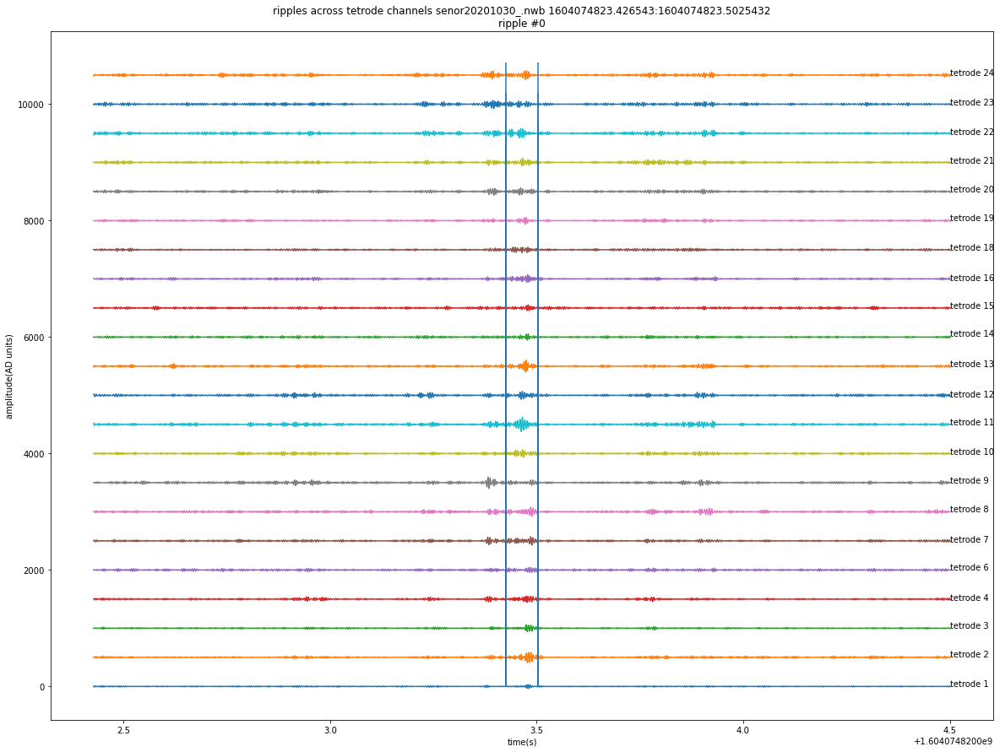

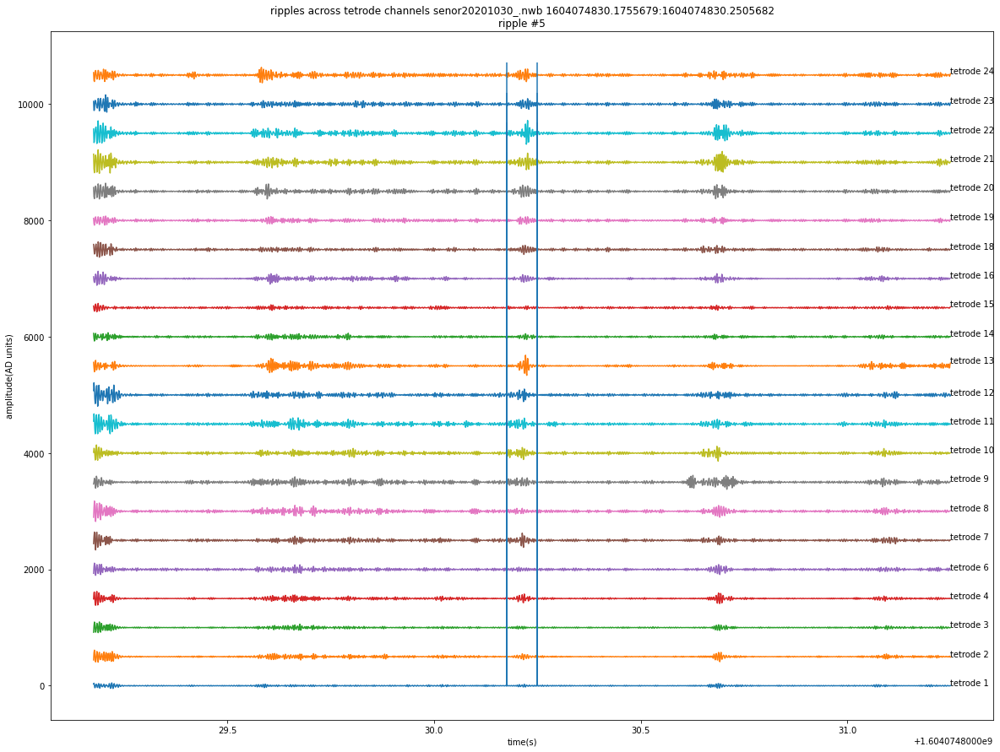

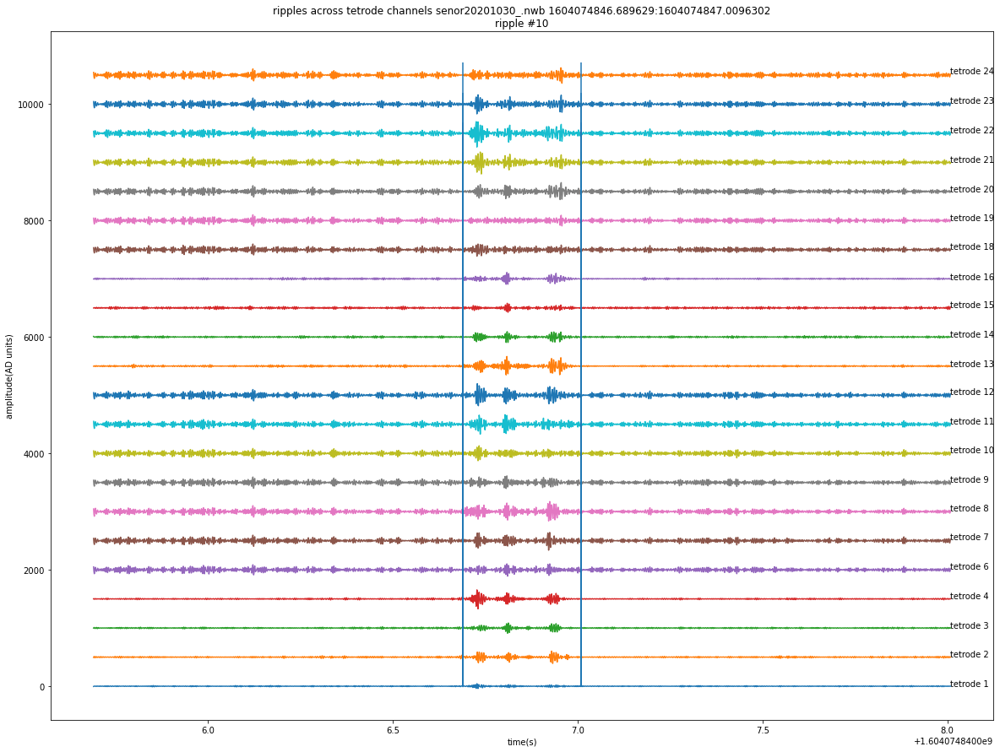

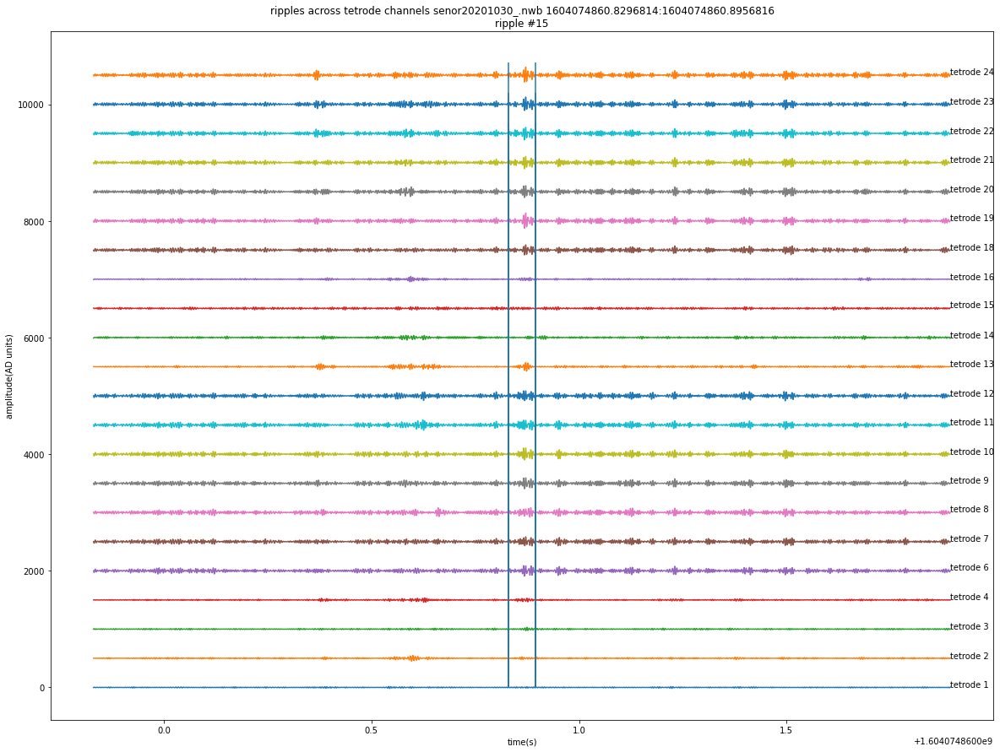

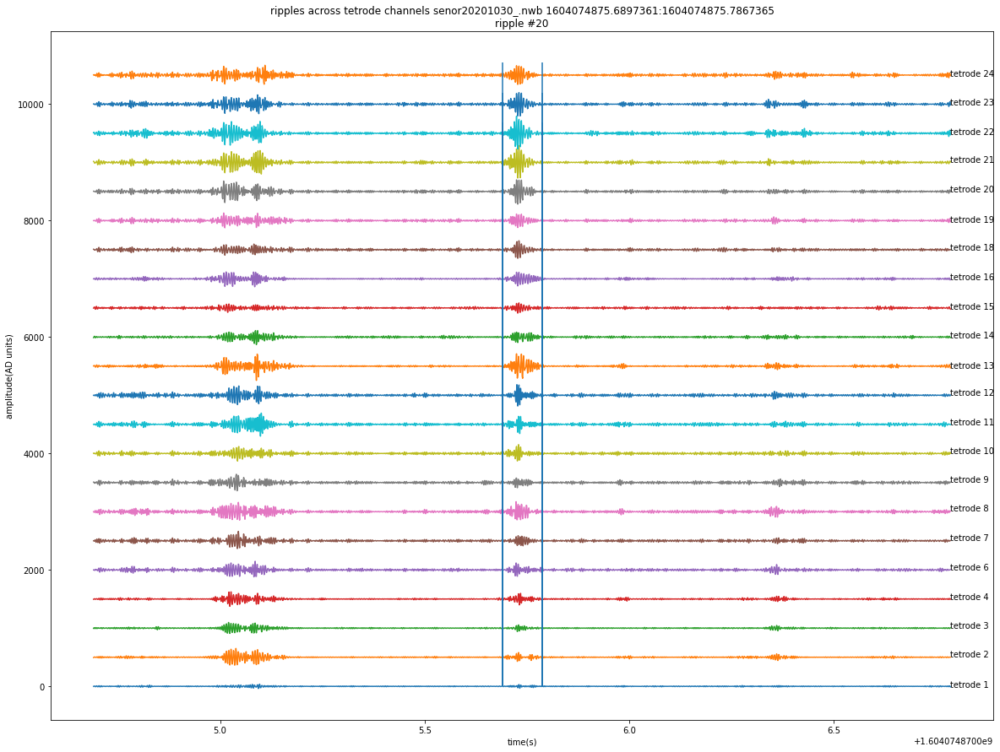

...

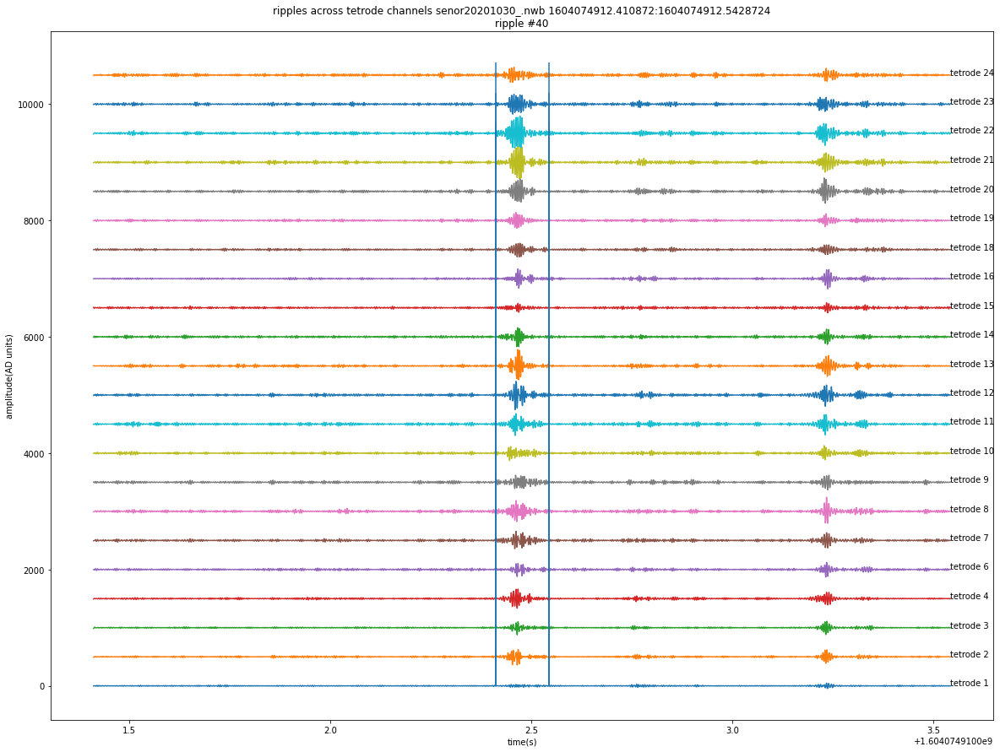

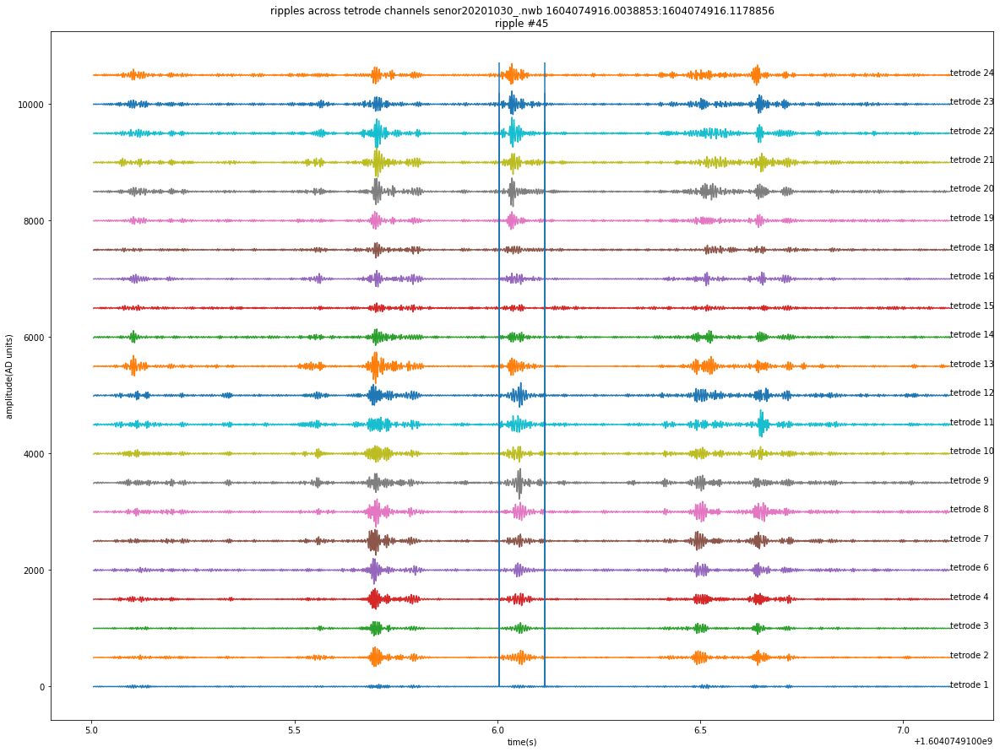

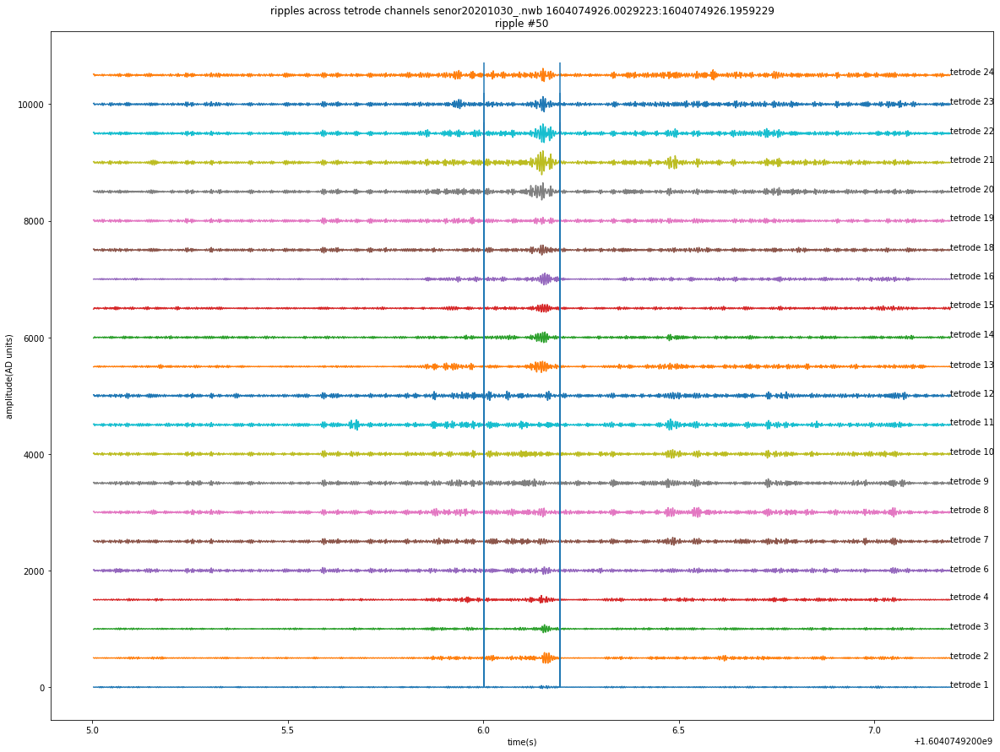

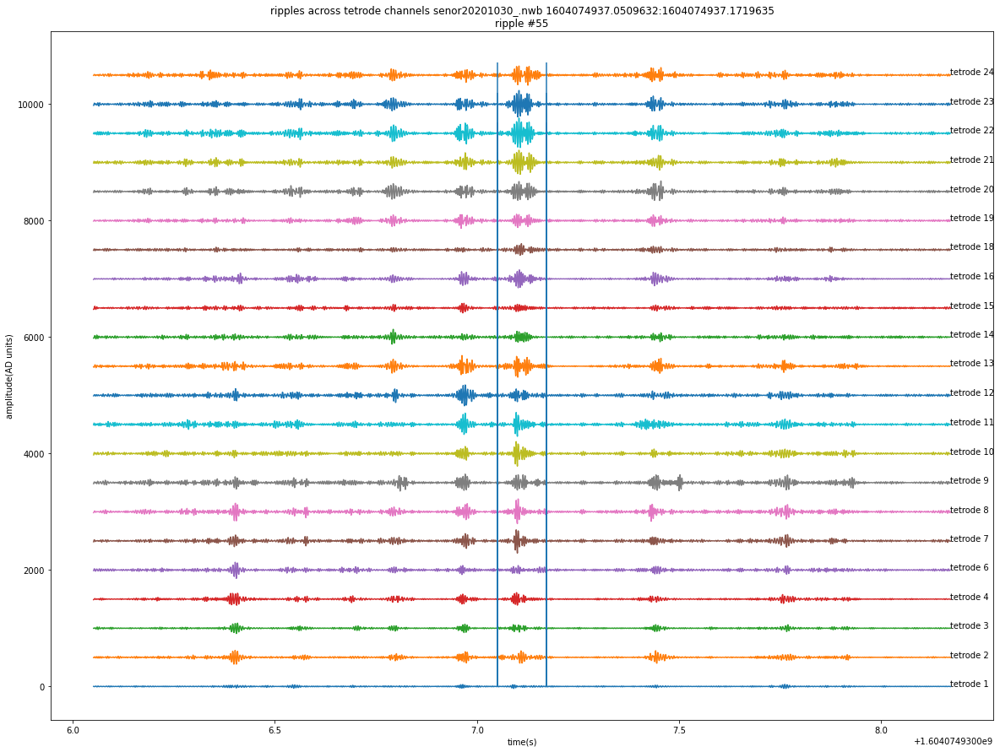

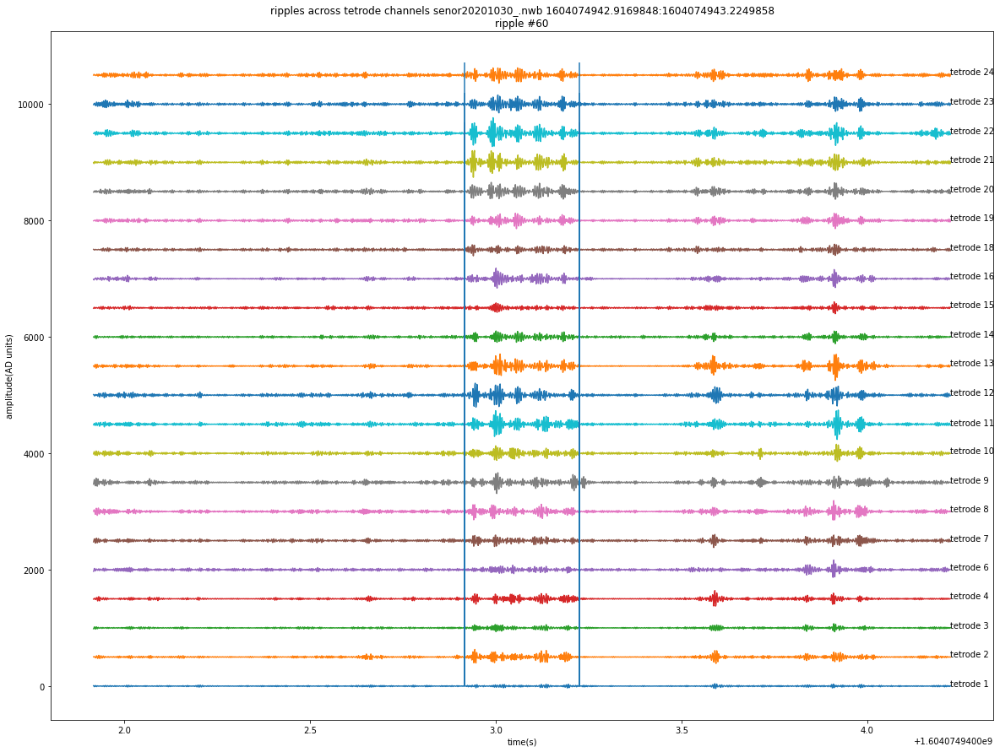

In [488]:
ripple_eseries = lfp_ripple_object['filtered_data']
ripple_data = ripple_eseries.data
ripple_timestamps = ripple_eseries.timestamps

ripple_num = [0,5,10,15,20,25,30,35,40,45,50, 55,60]
for rip in range(len(ripple_num)):

    plottimes = [ripple_times_df['start_time'].values[ripple_num[rip]], 
                 ripple_times_df['end_time'].values[ripple_num[rip]]]
    x_elect, y_elect= get_x_y_timestamp_list(plottimes[0], plottimes[1], ripple_elecs, ripple_eseries, ripple_timestamps, ripple_data)


    plt.figure(figsize=(20,15))
    for ix in range(len(x_elect)):
        plt.plot(x_elect[0],y_elect[ix]+500*ix,label=ripple_elecs[ix])
        plt.text(x_elect[0][-1], y_elect[ix][-1]+500*ix, f'tetrode {int(ripple_elecs[ix]/4)+1}')
        plt.title(f'ripples across tetrode channels {nwb_file_name} {plottimes[0]}:{plottimes[1]}\nripple #{ripple_num[rip]}')
        plt.xlabel('time(s)')
        plt.ylabel('amplitude(AD units)')
        plt.vlines(plottimes[0],0,510*ix)
        plt.vlines(plottimes[1],0,510*ix)

In [321]:
# Get LFP sampling rate
lfp_sampling_rate = (LFPBand & {'nwb_file_name' : nwb_file_name,
                               'filter_name' : 'Ripple 150-250 Hz'}).fetch('lfp_band_sampling_rate')

# Get animal speed upsampled to LFP sampling rate
lfp_pos_df = (IntervalPositionInfo & {'nwb_file_name' : nwb_file_name,
                                      'interval_list_name' : 'pos 0 valid times',
                                      'position_info_param_name' : 'default_lfp'}).fetch1_dataframe()

# Head speed in cm/s - because that is a param of the ripple detection detection 
head_speed = np.asarray(lfp_pos_df.head_speed)

# Position timestamps in s
pos_time = lfp_pos_df.index

# Get ripple-filtered LFP
lfp_ripple_object = (LFPBand & {'nwb_file_name' : nwb_file_name,
                                'filter_name' : 'Ripple 150-250 Hz'}).fetch_nwb()[0]

# Ripple-filtered LFP in AD units
# No need to convert to volts because ripple detection occurs on standardized data
lfp_ripple = np.asarray( lfp_ripple_object['filtered_data'].data, dtype='double' )

#lfp_ripple_object['filtered_data'].data = all the electrodes, filtered in the ripple band 
#lfp_ripple = array of that 
# LFP timestamps in s

lfp_time = lfp_ripple_object['filtered_data'].timestamps[:]

# The LFP timestamps start before position timestamps, so the two need to be aligned
# Align the LFP to the start of the position timestamps as closely as possible

start_idx = np.where(lfp_time[0] >= pos_time)[0][-1]
# start_idx = np.where(pos_time[0] >= lfp_time)[0][-1] - RN original


try:
    lfp_align_ind = np.full((len(pos_time)), False)
    lfp_align_ind[start_idx:start_idx+len(pos_time)] = True
    lfp_ripple = lfp_ripple[lfp_align_ind, :]

except:
    print("Couldn't align LFP to position timestamps")

# Find which tetrode each LFP trace belongs to
lfp_electrode_ids = lfp_ripple_object['filtered_data'].electrodes[:].index
electrode_groups = [(Electrode() & {'nwb_file_name' : nwb_file_name,
                                    'electrode_id' : lfp_electrode}).fetch1('electrode_group_name')
                     for lfp_electrode in lfp_electrode_ids]

# # Detect ripples on intermediate CA1 but exclude reference - see below! 
tetrode_ind = np.asarray( [int(group_name) <= 23 for group_name in electrode_groups] )
tetrode_ind[[4,5,17]] = False
# tetrode_ind[5] = False
# tetrode_ind[17] = False 


ripple_times_df = Kay_ripple_detector(pos_time,
                                      lfp_ripple[:, tetrode_ind],
                                      head_speed,
                                      lfp_sampling_rate,
                                      speed_threshold=4.0,
                                      minimum_duration=0.015,
                                      zscore_threshold=2.0,
                                      smoothing_sigma=0.004,
                                      close_ripple_threshold=0.0)
# #Konsensus method

In [424]:
len(head_speed)

2356506

In [498]:
plottimes = [ripple_times_df['start_time'].values[149], 
             ripple_times_df['end_time'].values[149]]

In [499]:
lfp_band_eseries = (LFPBand() & {'nwb_file_name' : nwb_file_name}& {'filter_name' : 'Ripple 150-250 Hz'}).fetch_nwb()[0]['filtered_data']
# (LFPBand() & {'nwb_file_name' : nwb_file_name}& {'filter_name' : 'Ripple 150-250 Hz'} )#.fetch_nwb()[0]['filtered_data']


In [500]:
orig_time_ind = np.argwhere(np.logical_and(raw_eseries.timestamps > plottimes[0]-1, raw_eseries.timestamps < plottimes[1]+1))
lfp_time_ind = np.argwhere(np.logical_and(lfp_eseries.timestamps > plottimes[0]-1, lfp_eseries.timestamps < plottimes[1]+1))
lfp_band_time_ind = np.argwhere(np.logical_and(lfp_band_eseries.timestamps > plottimes[0]-1, lfp_band_eseries.timestamps < plottimes[1]+1))

lfp_elect_indeces = get_electrode_indices(lfp_eseries, lfp_band_electrode_ids)
orig_elect_indeces = get_electrode_indices(raw_eseries, lfp_band_electrode_ids)
lfp_band_elect_indeces = get_electrode_indices(lfp_band_eseries, lfp_band_electrode_ids)





In [151]:
lfp_band_electrode_ids

Int64Index([  0,   4,   8,  12,  16,  17,  20,  24,  28,  32,  36,  40,  44,
             48,  52,  56,  60,  64,  68,  72,  76,  80,  84,  88,  92, 128,
            132, 136, 140, 144, 148, 152, 156, 160, 164, 168, 172, 176, 180,
            184, 188, 192, 196, 200, 204, 208, 212, 216, 220, 224, 228, 232,
            236, 240, 244, 248, 252, 256, 260, 264, 268, 272, 276, 280, 284,
            288, 292, 296, 300, 304, 308, 312, 316, 320, 324, 328, 332, 336,
            340, 344, 348, 352, 356, 360, 364, 368, 372, 376, 380],
           dtype='int64', name='id')

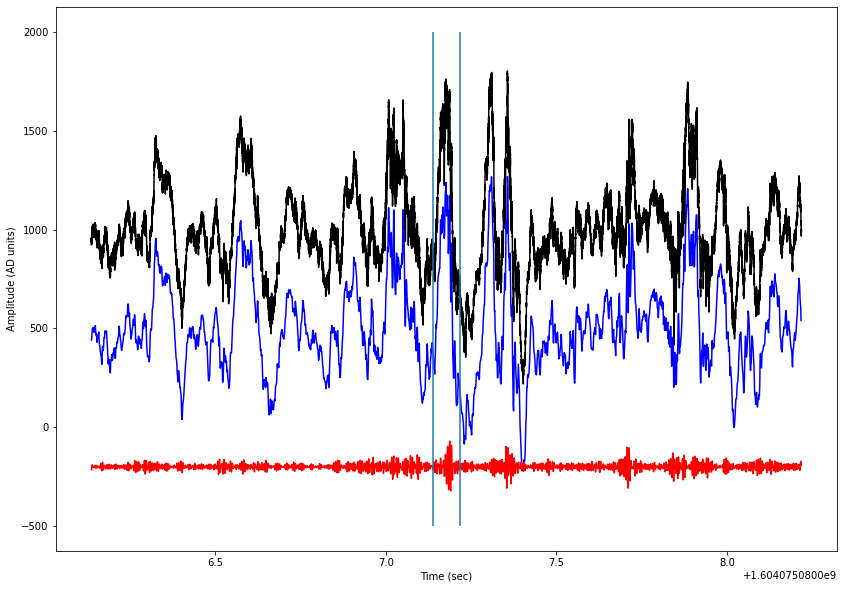

In [501]:

plt.figure(figsize=(14,10))
plt.plot(raw_eseries.timestamps[orig_time_ind], raw_eseries.data[orig_time_ind,orig_elect_indeces[12]]+1000, 'k-')
plt.plot(lfp_eseries.timestamps[lfp_time_ind], lfp_eseries.data[lfp_time_ind,lfp_elect_indeces[12]]+500, 'b-')
plt.plot(lfp_band_eseries.timestamps[lfp_band_time_ind], 
         lfp_band_eseries.data[lfp_band_time_ind,lfp_band_elect_indeces[12]]-200, 'r-')
plt.xlabel('Time (sec)')
plt.ylabel('Amplitude (AD units)')
plt.vlines(plottimes[0],-500,2000)
plt.vlines(plottimes[1],-500,2000)
plt.show()


In [152]:
# for ix in range(len(ripple_times_df)):
#     plottimes = [ripple_times_df['start_time'].values[ix], 
#              ripple_times_df['end_time'].values[ix]]
#     orig_time_ind = np.argwhere(np.logical_and(orig_eseries.timestamps > plottimes[0], orig_eseries.timestamps < plottimes[1]))
#     lfp_time_ind = np.argwhere(np.logical_and(lfp_eseries.timestamps > plottimes[0], lfp_eseries.timestamps < plottimes[1]))
#     lfp_band_time_ind = np.argwhere(np.logical_and(lfp_band_eseries.timestamps > plottimes[0], lfp_band_eseries.timestamps < plottimes[1]))

#     lfp_elect_indeces = get_electrode_indices(lfp_eseries, lfp_band_electrode_ids)
#     orig_elect_indeces = get_electrode_indices(orig_eseries, lfp_band_electrode_ids)
#     lfp_band_elect_indeces = get_electrode_indices(lfp_band_eseries, lfp_band_electrode_ids)
    
#     plt.figure(figsize=(10,5))
#     plt.plot(orig_eseries.timestamps[orig_time_ind], orig_eseries.data[orig_time_ind,orig_elect_indeces[0]]+1000, 'k-')
#     plt.plot(lfp_eseries.timestamps[lfp_time_ind], lfp_eseries.data[lfp_time_ind,lfp_elect_indeces[0]]+500, 'b-')
#     plt.plot(lfp_band_eseries.timestamps[lfp_band_time_ind], 
#              lfp_band_eseries.data[lfp_band_time_ind,lfp_band_elect_indeces[0]]-200, 'r-')
#     plt.xlabel('Time (sec)')
#     plt.ylabel('Amplitude (AD units)')

#     plt.show()

NameError: name 'orig_eseries' is not defined

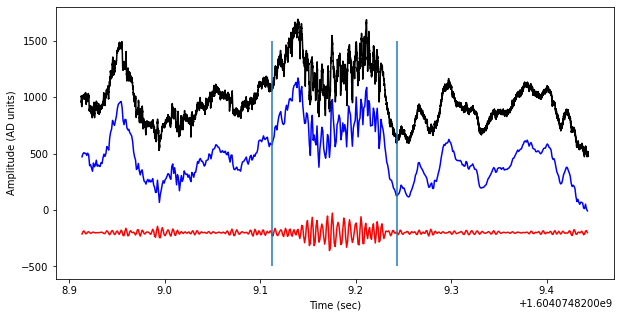

In [490]:
ix = 3
time_around = .2

plottimes = [ripple_times_df['start_time'].values[ix], 
             ripple_times_df['end_time'].values[ix]]

orig_time_ind = np.argwhere(np.logical_and(raw_eseries.timestamps > plottimes[0]-time_around, raw_eseries.timestamps < plottimes[1]+time_around))
lfp_time_ind = np.argwhere(np.logical_and(lfp_eseries.timestamps > plottimes[0]-time_around, lfp_eseries.timestamps < plottimes[1]+time_around))
lfp_band_time_ind = np.argwhere(np.logical_and(lfp_band_eseries.timestamps > plottimes[0]-time_around, lfp_band_eseries.timestamps < plottimes[1]+time_around))

lfp_elect_indeces = get_electrode_indices(lfp_eseries, lfp_band_electrode_ids)
orig_elect_indeces = get_electrode_indices(raw_eseries, lfp_band_electrode_ids)
lfp_band_elect_indeces = get_electrode_indices(lfp_band_eseries, lfp_band_electrode_ids)
    
plt.figure(figsize=(10,5))
plt.plot(raw_eseries.timestamps[orig_time_ind], raw_eseries.data[orig_time_ind,orig_elect_indeces[20]]+1000, 'k-')
plt.plot(lfp_eseries.timestamps[lfp_time_ind], lfp_eseries.data[lfp_time_ind,lfp_elect_indeces[20]]+500, 'b-')
plt.plot(lfp_band_eseries.timestamps[lfp_band_time_ind], 
             lfp_band_eseries.data[lfp_band_time_ind,lfp_band_elect_indeces[20]]-200, 'r-')
plt.xlabel('Time (sec)')
plt.ylabel('Amplitude (AD units)')
plt.vlines(ripple_times_df['start_time'].values[ix],-500,1500)
plt.vlines(ripple_times_df['end_time'].values[ix],-500,1500)


plt.show()

In [158]:
Kay_ripple_detector?

Signature:
Kay_ripple_detector(
    time,
    filtered_lfps,
    speed,
    sampling_frequency,
    speed_threshold=4.0,
    minimum_duration=0.015,
    zscore_threshold=2.0,
    smoothing_sigma=0.004,
    close_ripple_threshold=0.0,
)
Docstring:
Find start and end times of sharp wave ripple events (150-250 Hz)
based on Kay et al. 2016 [1].

Parameters
----------
time : array_like, shape (n_time,)
filtered_lfps : array_like, shape (n_time, n_signals)
    Bandpass filtered time series of electric potentials in the ripple band
speed : array_like, shape (n_time,)
    Running speed of animal
sampling_frequency : float
    Number of samples per second.
speed_threshold : float, optional
    Maximum running speed of animal for a ripple
minimum_duration : float, optional
    Minimum time the z-score has to stay above threshold to be
    considered a ripple. The default is given assuming time is in
    units of seconds.
zscore_threshold : float, optional
    Number of standard deviations the ri

In [159]:
ripple_times_df

,start_time,end_time
ripple_number,,
1,1.604075e+09,1.604075e+09
2,1.604075e+09,1.604075e+09
3,1.604075e+09,1.604075e+09
4,1.604075e+09,1.604075e+09
5,1.604075e+09,1.604075e+09
...,...,...
1013,1.604077e+09,1.604077e+09
1014,1.604077e+09,1.604077e+09
1015,1.604077e+09,1.604077e+09


In [216]:
ripple_times_df

,start_time,end_time
ripple_number,,
1,1.604075e+09,1.604075e+09
2,1.604075e+09,1.604075e+09
3,1.604075e+09,1.604075e+09
4,1.604075e+09,1.604075e+09
5,1.604075e+09,1.604075e+09
...,...,...
1013,1.604077e+09,1.604077e+09
1014,1.604077e+09,1.604077e+09
1015,1.604077e+09,1.604077e+09


1604074829.112564 1604074829.2435646


,start_time,end_time
ripple_number,,
1,1.604075e+09,1.604075e+09
2,1.604075e+09,1.604075e+09
3,1.604075e+09,1.604075e+09
4,1.604075e+09,1.604075e+09
5,1.604075e+09,1.604075e+09
...,...,...
1021,1.604077e+09,1.604077e+09
1022,1.604077e+09,1.604077e+09
1023,1.604077e+09,1.604077e+09


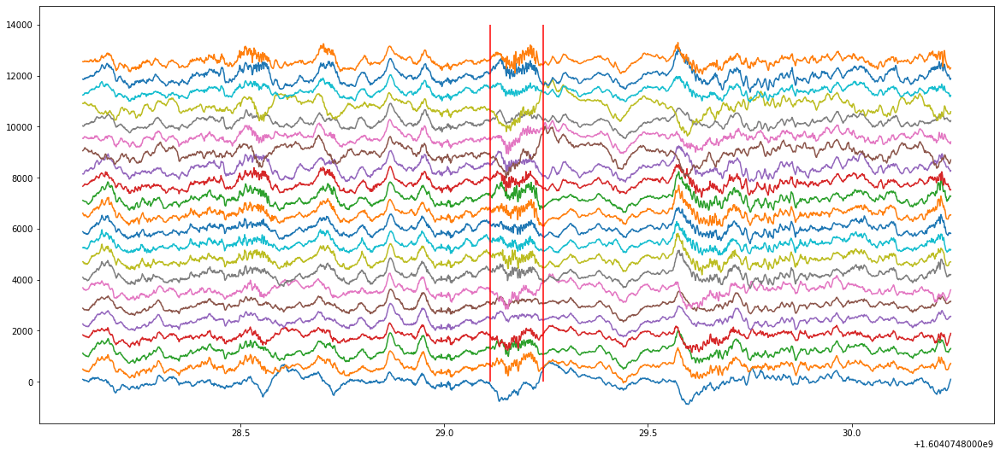

In [493]:
ripple_num = 4
start_time = ripple_times_df.start_time[ripple_num]
end_time = ripple_times_df.end_time[ripple_num]
print(start_time,end_time)

# electrode_id = 44
            #get electrode id from list
plt.figure(figsize=(20,9))
for ix in range(len(ripple_elecs)):
    #ripple_elecs are the tetrodes, minus references, that went into ripple detector
    electrode_id_ix = lfp_electrode_ids[ix]
                #get the index for that electrode id using the helper function 
    index = get_electrode_indices(lfp_eseries,[electrode_id_ix])
        #         # make the mask using the times 
        #         #apply the mask to the lfp timestamps and data, using the index for electrode from helper function

    mask_start_timestamp = lfp_timestamps>start_time-1
    mask_end_timestamp = lfp_timestamps<end_time+1

    x = lfp_timestamps[mask_start_timestamp & mask_end_timestamp]
    y = lfp_data[(mask_start_timestamp & mask_end_timestamp),index[0]]
    #             #append a list that will be the return of the funciton, that one will iterate through in the notebook to use. 
    
    plt.plot(x,y+(600*ix))
plt.vlines(start_time,0*20,700*20,color='red')
plt.vlines(end_time,0*20,700*20,color='red')
# plt.title(f'ripple number {ripple_num}')
ripple_times_df

Text(0, 0.5, 'ripple length (s)')

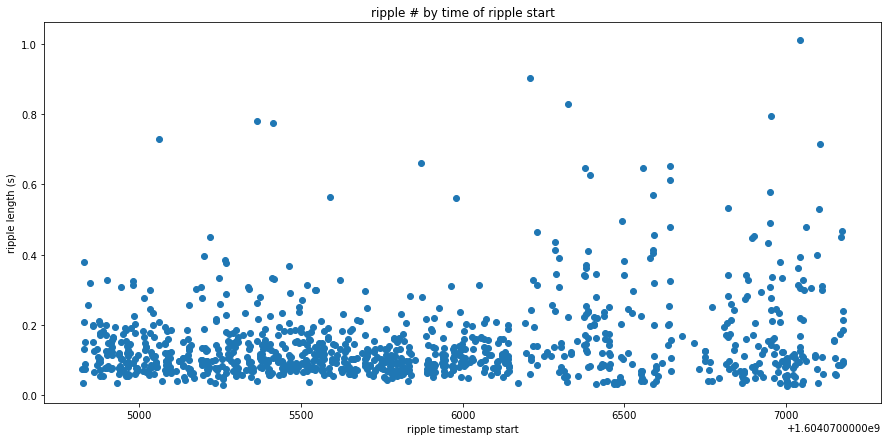

In [491]:
ripple_len=[]
plt.figure(figsize=(15,7))
for ix in range(1,len(ripple_times_df)+1):
    ripple_end = ripple_times_df.end_time[ix]
    ripple_start = ripple_times_df.start_time[ix]
    ripple_len.append(ripple_end-ripple_start)
plt.scatter(ripple_times_df.start_time,ripple_len)
plt.title('ripple # by time of ripple start')
plt.xlabel('ripple timestamp start')
plt.ylabel('ripple length (s)')